# Dataexploration
In this notebook I am trying to give some insights into the Thermocron Dataset. <br>

In [1]:
%matplotlib inline

In [2]:
# Some wider view
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

In [3]:
import urllib
import os
import numpy as np
import pandas as pd
import geopandas as gpd
from geopandas import GeoDataFrame, read_file
from datetime import datetime, timedelta
from pyproj import CRS
import matplotlib.pyplot as plt
import matplotlib.style as style
style.available
import seaborn as sns
import plotly_express as px

import sys
sys.path.append("..")
import movingpandas as mpd

import warnings
warnings.simplefilter("ignore")

import hvplot.pandas # seems to be necessary for the following import to work
from holoviews import opts
opts.defaults(opts.Overlay(active_tools=['wheel_zoom']))

In [55]:
# Reading in the dataset
df = pd.read_csv("ThermochronTracking Elephants Kruger 2007.csv")
# Creating a datetime column
df['timestamps'] = pd.to_datetime(df['timestamp'])
df = df.set_index('timestamps').tz_localize(None)
print("This dataset contains {} records.\nThe first lines are:".format(len(df)))
df.head()
# Creating a GeoDataFrame
ndf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df['location-long'], df['location-lat']))
ndf.head()

This dataset contains 283688 records.
The first lines are:


,event-id,visible,timestamp,location-long,location-lat,external-temperature,sensor-type,individual-taxon-canonical-name,tag-local-identifier,individual-local-identifier,study-name,geometry
timestamps,,,,,,,,,,,,
2007-08-13 00:30:00,9421351127,True,2007-08-13 00:30:00.000,31.87091,-24.81373,24.0,gps,Loxodonta africana,AM105,AM105,ThermochronTracking Elephants Kruger 2007,POINT (31.87091 -24.81373)
2007-08-13 02:00:00,9421351128,True,2007-08-13 02:00:00.000,31.87399,-24.81483,23.0,gps,Loxodonta africana,AM105,AM105,ThermochronTracking Elephants Kruger 2007,POINT (31.87399 -24.81483)
2007-08-13 03:31:00,9421351129,True,2007-08-13 03:31:00.000,31.87724,-24.81673,21.0,gps,Loxodonta africana,AM105,AM105,ThermochronTracking Elephants Kruger 2007,POINT (31.87724 -24.81673)
2007-08-13 04:00:00,9421351130,True,2007-08-13 04:00:00.000,31.87822,-24.81569,21.0,gps,Loxodonta africana,AM105,AM105,ThermochronTracking Elephants Kruger 2007,POINT (31.87822 -24.81569)
2007-08-13 06:00:00,9421351131,True,2007-08-13 06:00:00.000,31.89554,-24.79870,22.0,gps,Loxodonta africana,AM105,AM105,ThermochronTracking Elephants Kruger 2007,POINT (31.89554 -24.79870)


In [29]:
# Reading in the dataset
df = pd.read_csv("imputed_data18002.csv", header = 0, names=['timestamp', "long", "lat", "temp", "individual-local-identifier"])
# Creating a datetime column
df['timestamps'] = pd.to_datetime(df['timestamp'])
df = df.set_index('timestamps').tz_localize(None)
print("This dataset contains {} records.\nThe first lines are:".format(len(df)))
df.head()
# Creating a GeoDataFrame
ndf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df['long'], df['lat'])) #da war vorher location-long/ location-lat
ndf.head()


This dataset contains 426361 records.
The first lines are:


,timestamp,long,lat,temp,individual-local-identifier,geometry
timestamps,,,,,,
2007-08-13 00:30:00,2007-08-13 00:30:00,31.874252,-24.81373,24.0,AM105,POINT (31.87425 -24.81373)
2007-08-13 01:00:00,2007-08-13 01:00:00,31.874649,-24.81373,24.0,AM105,POINT (31.87465 -24.81373)
2007-08-13 01:30:00,2007-08-13 01:30:00,31.874974,-24.81373,24.0,AM105,POINT (31.87497 -24.81373)
2007-08-13 02:00:00,2007-08-13 02:00:00,31.876688,-24.81428,23.5,AM105,POINT (31.87669 -24.81428)
2007-08-13 02:30:00,2007-08-13 02:30:00,31.878138,-24.81483,23.0,AM105,POINT (31.87814 -24.81483)


In [5]:
ndf.columns

Index(['event-id', 'visible', 'timestamp', 'location-long', 'location-lat',
       'external-temperature', 'sensor-type',
       'individual-taxon-canonical-name', 'tag-local-identifier',
       'individual-local-identifier', 'study-name', 'geometry'],
      dtype='object')

In [6]:
ndf.rename(columns={"location-long": "long", "location-lat": "lat"}, inplace=True)
ndf.head()

,event-id,visible,timestamp,long,lat,external-temperature,sensor-type,individual-taxon-canonical-name,tag-local-identifier,individual-local-identifier,study-name,geometry
timestamps,,,,,,,,,,,,
2007-08-13 00:30:00,9421351127,True,2007-08-13 00:30:00.000,31.87091,-24.81373,24.0,gps,Loxodonta africana,AM105,AM105,ThermochronTracking Elephants Kruger 2007,POINT (31.87091 -24.81373)
2007-08-13 02:00:00,9421351128,True,2007-08-13 02:00:00.000,31.87399,-24.81483,23.0,gps,Loxodonta africana,AM105,AM105,ThermochronTracking Elephants Kruger 2007,POINT (31.87399 -24.81483)
2007-08-13 03:31:00,9421351129,True,2007-08-13 03:31:00.000,31.87724,-24.81673,21.0,gps,Loxodonta africana,AM105,AM105,ThermochronTracking Elephants Kruger 2007,POINT (31.87724 -24.81673)
2007-08-13 04:00:00,9421351130,True,2007-08-13 04:00:00.000,31.87822,-24.81569,21.0,gps,Loxodonta africana,AM105,AM105,ThermochronTracking Elephants Kruger 2007,POINT (31.87822 -24.81569)
2007-08-13 06:00:00,9421351131,True,2007-08-13 06:00:00.000,31.89554,-24.79870,22.0,gps,Loxodonta africana,AM105,AM105,ThermochronTracking Elephants Kruger 2007,POINT (31.89554 -24.79870)


In [14]:
tag  = df['individual-local-identifier'].unique()
print('These are the herds that were observed')
print(tag)
name = df['individual-taxon-canonical-name'].unique()
print(name)

These are the herds that were observed
['AM105' 'AM107' 'AM108' 'AM110' 'AM239' 'AM253' 'AM254' 'AM255' 'AM306'
 'AM307' 'AM308' 'AM91' 'AM93' 'AM99']


KeyError: 'individual-taxon-canonical-name'

In [30]:
# CRS is 3857. Defined to be able to map the data with the given coordinates
ndf.set_crs(epsg=3857, inplace=True)
original_crs = ndf.crs
original_crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World - 85°S to 85°N
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [93]:
# Geographic extent: Is the geographical extent as expected and are there holes in the spatial coverage?
plot = ndf.to_crs({'init': 'epsg:3857'}).hvplot(title='Geographic extent of the dataset', geo=True, tiles='OSM', width=500, height=500)
hvplot.save(plot, 'Geographic extent of the dataset.html')

In [16]:
print("The dataset covers the time between {} and {}.".format(ndf.index.min(), df.index.max()))
print("That's {}".format(df.index.max() - df.index.min()))

The dataset covers the time between 2007-08-13 00:30:00 and 2009-08-12 21:30:00.
That's 730 days 21:00:00


In [18]:
plot2 = ndf['individual-local-identifier'].resample('1d').count().hvplot(title='Number of records per day', width=1800, height=800) # da war vorher 'event-id'
hvplot.save(plot2, 'number_of_records_per_day.html')

In [20]:
# Does the geographic extent vary over time or do holes appear during certain times?
ndf['Y-M'] = ndf.index.to_period('M')
a = None
for i in ndf['Y-M'].unique():
    plot = ndf[ndf['Y-M']==i].hvplot(title=str(i), size=2, geo=True, tiles='OSM', width=600, height=600)
    if a: a = a + plot
    else: a = plot

:Layout
   .Overlay.I     :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.II    :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.III   :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.IV    :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.V     :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.VI    :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.VII   :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.VIII  :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.IX    :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.X     :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.XI    :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.XII   :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.XIII  :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.XIV   :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.XV    :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.XVI   :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.XVII  :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.XVIII :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.XIX   :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.XX    :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.XXI   :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.XXII  :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.XXIII :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.XXIV  :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]
   .Overlay.XXV   :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Points.I :Points   [Longitude,Latitude]

In [21]:
hvplot.save(a, 'OSM.html')

In [19]:
#  Is the data sampled at regular or irregular intervals?
t = ndf.reset_index().timestamps
ndf = ndf.assign(delta_t=t.diff().values)
ndf['delta_t'] = ndf['delta_t'].dt.total_seconds()/60
plot3 = pd.DataFrame(ndf).hvplot.hist('delta_t', title='Histogram of intervals between consecutive records (in minutes)', bins=60, bin_range=(0, 1000), width=2000, height=950)

In [20]:
hvplot.save(plot3, 'intervals_between_records.html')

In [31]:
tc = mpd.TrajectoryCollection(ndf, 'individual-local-identifier')
traj = tc.trajectories[0]
traj.add_speed()
max_speed = traj.df.speed.max()
print("The highest computed speed is {:,.5f} m/s ({:,.5f} km/h)".format(max_speed, max_speed*3600/1000))

The highest computed speed is 0.00009 m/s (0.00031 km/h)


In [57]:
df = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df['location-long'], df['location-lat']))
# CRS is 3857. Defined to be able to map the data with the given coordinates
df.set_crs(epsg=3857, inplace=True)
original_crs = df.crs
original_crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World - 85°S to 85°N
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [32]:
plot4 = pd.DataFrame(traj.df).hvplot.hist('speed', title='Histogram of speeds (in meters per second)', bins=120, width = 1500, height = 700)
plot4

:Histogram   [speed]   (speed_count)

In [87]:
# Speed shows no surprising patterns.
hvplot.save(plot4, 'Histogram of speeds.html')

In [33]:
# Movement directions
traj.add_direction(overwrite=True)
plot5 = pd.DataFrame(traj.df).hvplot.hist('direction', title='Histogram of directions', bins=90, width = 1500, height = 700)
pd.DataFrame(traj.df).hvplot.hist('direction', title='Histogram of directions', bins=90)

:Histogram   [direction]   (direction_count)

In [85]:
# There is some variation in movement directions but no directions stand out in the histogram.
hvplot.save(plot5, 'Histogram of directions.html')

In [34]:
# Does the movement make sense in its temporal context?
plot6 = pd.DataFrame(traj.df).hvplot.heatmap(title='Mean speed by hour of day and month of year', 
                                     x='timestamps.hour', y='timestamps.month', C='speed', reduce_function=np.mean, width = 1500, height = 700)
pd.DataFrame(traj.df).hvplot.heatmap(title='Mean speed by hour of day and month of year', 
                                     x='timestamps.hour', y='timestamps.month', C='speed', reduce_function=np.mean)

:HeatMap   [timestamps.hour,timestamps.month]   (speed)

In [83]:
# In the summer months (Dec - March) it can clearly be seen that the animnals move faster
hvplot.save(plot6, 'Mean speed by hour of day and month of year.html')

In [26]:
traj.df['n'] = 1
plot7 = pd.DataFrame(traj.df).hvplot.heatmap(title='Record count by temperature and month of year', 
                                     x='temp', y='timestamps.month', C='n', reduce_function=np.sum, width = 1500, height = 700) # vorher war da external-temperature
pd.DataFrame(traj.df).hvplot.heatmap(title='Record count by temperature and month of year', 
                                     x='temp', y='timestamps.month', C='n', reduce_function=np.sum) # vorher war da external-temperature

:HeatMap   [temp,timestamps.month]   (n)

In [81]:
hvplot.save(plot7, 'Record count by temperature and month of year.html')

In [27]:
plot8 = pd.DataFrame(traj.df).hvplot.heatmap(title='Mean speed by temperature and month of year', 
                                     x='temp', y='timestamps.month', C='speed', reduce_function=np.mean, width = 1500, height = 700)
pd.DataFrame(traj.df).hvplot.heatmap(title='Mean speed by temperature and month of year', 
                                     x='temp', y='timestamps.month', C='speed', reduce_function=np.mean)

:HeatMap   [temp,timestamps.month]   (speed)

In [88]:
hvplot.save(plot8, 'Mean speed by temperature and month of year.html')

In [28]:
daily = mpd.TemporalSplitter(tc).split(mode='day')
daily_lengths = [traj.get_length() for traj in daily]
daily_t = [traj.get_start_time() for traj in daily]
daily_lengths = pd.DataFrame(daily_lengths, index=daily_t, columns=['length'])
daily_lengths.hvplot(title='Daily trajectory length')

:Curve   [index]   (length)

In [14]:
# You can see that the trajectory length are longer in the summer months

In [97]:
# convex hulls around trajectory (covered areas)
daily_areas = [(traj.id, traj.to_crs(CRS(3857)).to_linestring().convex_hull.area/10000) for traj in daily]
daily_areas = pd.DataFrame(daily_areas, index=daily_t, columns=['id', 'area'])
daily_areas.hvplot(title='Daily covered area [ha]', y='area')

:Curve   [index]   (area)

In [98]:
# Biggest areas in summer months
daily_areas.sort_values(by='area')[-10:]

,id,area
2009-03-01 00:21:00,AM91_2009-03-01 00:00:00,4.859019e-07
2009-03-13 02:31:00,AM110_2009-03-13 00:00:00,4.964314e-07
2008-03-11 00:17:00,AM91_2008-03-11 00:00:00,5.063815e-07
2008-03-11 00:00:00,AM93_2008-03-11 00:00:00,5.089734e-07
2008-07-26 00:00:00,AM307_2008-07-26 00:00:00,5.515618e-07
2008-02-11 00:00:00,AM255_2008-02-11 00:00:00,5.782130e-07
2009-01-21 00:23:00,AM91_2009-01-21 00:00:00,6.026373e-07
2009-01-21 00:00:00,AM93_2009-01-21 00:00:00,6.117384e-07
2009-03-17 00:30:00,AM110_2009-03-17 00:00:00,7.563424e-07
2009-03-17 01:00:00,AM99_2009-03-17 00:00:00,7.676963e-07


In [99]:
daily_areas.sort_values(by='area')[:10] # smallest areas covered (rather in winter)

,id,area
2009-05-17 00:00:00,AM308_2009-05-17 00:00:00,0.0
2009-02-02 23:00:00,AM108_2009-02-02 00:00:00,0.0
2009-01-08 14:30:00,AM306_2009-01-08 00:00:00,0.0
2008-10-05 12:30:00,AM307_2008-10-05 00:00:00,0.0
2009-07-25 10:30:00,AM308_2009-07-25 00:00:00,0.0
2008-01-31 01:00:00,AM105_2008-01-31 00:00:00,0.0
2009-07-20 00:00:00,AM105_2009-07-20 00:00:00,0.0
2008-11-13 23:00:00,AM107_2008-11-13 00:00:00,0.0
2009-06-29 13:30:00,AM308_2009-06-29 00:00:00,0.0
2008-12-02 13:00:00,AM306_2008-12-02 00:00:00,0.0


In [100]:
a = None
for i in daily_areas.sort_values(by='area')[-10:].id:
    traj = daily.get_trajectory(i)
    if a: a = a + traj.hvplot(title=i, c='speed', line_width=2, cmap='RdYlBu', width=300, height=300)
    else: a = traj.hvplot(title=i, c='speed', line_width=2, cmap='RdYlBu', width=300, height=300)
a    

:Layout
   .Overlay.I    :Overlay
      .Tiles.I :Tiles   [x,y]
      .Path.I  :Path   [Longitude,Latitude]   (speed)
   .Overlay.II   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Path.I  :Path   [Longitude,Latitude]   (speed)
   .Overlay.III  :Overlay
      .Tiles.I :Tiles   [x,y]
      .Path.I  :Path   [Longitude,Latitude]   (speed)
   .Overlay.IV   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Path.I  :Path   [Longitude,Latitude]   (speed)
   .Overlay.V    :Overlay
      .Tiles.I :Tiles   [x,y]
      .Path.I  :Path   [Longitude,Latitude]   (speed)
   .Overlay.VI   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Path.I  :Path   [Longitude,Latitude]   (speed)
   .Overlay.VII  :Overlay
      .Tiles.I :Tiles   [x,y]
      .Path.I  :Path   [Longitude,Latitude]   (speed)
   .Overlay.VIII :Overlay
      .Tiles.I :Tiles   [x,y]
      .Path.I  :Path   [Longitude,Latitude]   (speed)
   .Overlay.IX   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Path.I  :Path   [Longitude,Latitude]   (speed)
   .Overlay.X    :Overlay
      .Tiles.I :Tiles   [x,y]
      .Path.I  :Path   [Longitude,Latitude]   (speed)

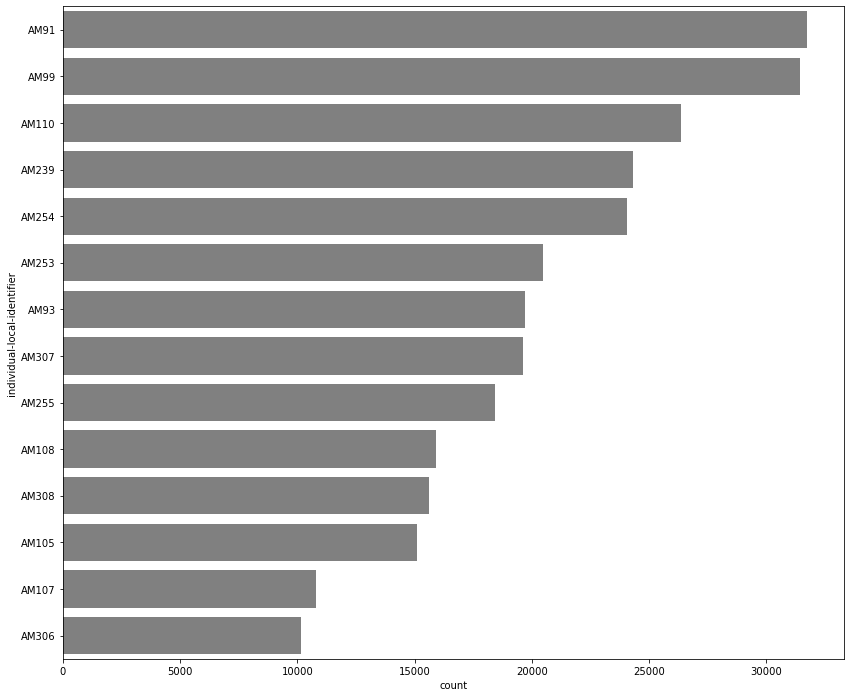

In [65]:
# How often individual got tracked
fig, ax = plt.subplots(1, figsize=(14,12))
sns.countplot(y = "individual-local-identifier", color = "grey", data = df, order = df['individual-local-identifier'].value_counts().index);
plt.savefig('countplot.svg')